In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from math import acos, degrees
from scipy.signal import find_peaks
import os.path
import glob
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import entropy
import pylab as pl
from numpy.fft import fft
from scipy import stats
import numpy
from scipy import signal
from scipy.signal import lfilter, lfilter_zi, filtfilt, butter
import matplotlib.patches as mpatches

In [42]:
chunk_width = 500#900
#centr_rang = 110

In [43]:
#Function to extract angle using 3 points coordinate
def angle3pt(a, b, c):
#    """Counterclockwise angle in degrees by turning from c to a around b
#        Returns a float between 0.0 and 360.0"""
    ang = math.degrees(
    math.atan2(c[1]-b[1], c[0]-b[0]) - math.atan2(a[1]-b[1], a[0]-b[0]))
    return ang + 360 if ang < 0 else ang


In [44]:
def getridofAngleJumps(alpha):
    alpha_rad = [x*(np.pi)/180 for x in alpha]
    alpha_rad = np.array(alpha_rad)
    alpha_rad[~np.isnan(alpha_rad)] = np.unwrap(alpha_rad[~np.isnan(alpha_rad)])
    alpha_unwrap= np.degrees(alpha_rad)
    return alpha_unwrap

In [45]:
def smooth_acausal(x,frequency = 0.300):
    #b, a = signal.butter(8, 0.150)
    sos = signal.butter(4, frequency, output='sos')
    y = signal.sosfiltfilt(sos, x)
    return y


In [46]:
def smooth(x,window_len=1,window='hanning'):
#    """smooth the data using a window with requested size.

    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")


    if window_len<3:
        return x


    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")


    s=np.r_[x[window_len-1:0:-1],x,x[-2:-window_len-1:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('numpy.'+window+'(window_len)')

    y=np.convolve(w/w.sum(),s,mode='valid')
    return y


In [47]:
#Function to extract LED trajectory from excel file
def LED_excel_to_array_preprocessed(file_path, chunk_width, trial_no):
    #Read csv file tail markers
    RidgeX = pd.read_csv(file_path[trial_no])

    #take just numeric values
    RidgeX=pd.to_numeric(RidgeX.iloc[:,0])

 
    return smooth(RidgeX.values)


In [48]:
#Function to plot tail angle trajectory
def plot_TailAngle(file_path, chunk_width, i, a, b):
    #Read csv file tail markers
    df = pd.read_csv(file_path[i])
#    df = pd.read_csv(file_path)
    #Rename marker columns
    df.rename(columns={'DLC_resnet50_Ridge_walkMay27shuffle1_1000000':'tail1_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.1':'tail1_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.2':'tail1_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.3':'tail2_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.4':'tail2_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.5':'tail2_lik',                       
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.6':'tail3_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.7':'tail3_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.8':'tail3_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.9':'tail4_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.10':'tail4_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.11':'tail4_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.12':'tail5_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.13':'tail5_y',                       
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.14':'tail5_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.15':'tail6_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.16':'tail6_y',  
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.17':'tail6_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.18':'tail7_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.19':'tail7_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.20':'tail7_lik',                       
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.21':'tail8_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.22':'tail8_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.23':'tail8_lik'}, 
                 inplace=True)

    #take just numeric values
    df.tail1_x=pd.to_numeric(df.tail1_x[a:b])
    df.tail1_y=pd.to_numeric(df.tail1_y[a:b])
    df.tail1_lik=pd.to_numeric(df.tail1_lik[a:b])
    df.tail2_x=pd.to_numeric(df.tail2_x[a:b])
    df.tail2_y=pd.to_numeric(df.tail2_y[a:b])
    df.tail2_lik=pd.to_numeric(df.tail2_lik[a:b])
    df.tail3_x=pd.to_numeric(df.tail3_x[a:b])
    df.tail3_y=pd.to_numeric(df.tail3_y[a:b])
    df.tail3_lik=pd.to_numeric(df.tail3_lik[a:b])
    df.tail4_x=pd.to_numeric(df.tail4_x[a:b])
    df.tail4_y=pd.to_numeric(df.tail4_y[a:b])
    df.tail4_lik=pd.to_numeric(df.tail4_lik[a:b])
    df.tail5_x=pd.to_numeric(df.tail5_x[a:b])
    df.tail5_y=pd.to_numeric(df.tail5_y[a:b])
    df.tail5_lik=pd.to_numeric(df.tail5_lik[a:b])
    df.tail6_x=pd.to_numeric(df.tail6_x[a:b])
    df.tail6_y=pd.to_numeric(df.tail6_y[a:b])
    df.tail6_lik=pd.to_numeric(df.tail6_lik[a:b])
    df.tail7_x=pd.to_numeric(df.tail7_x[a:b])
    df.tail7_y=pd.to_numeric(df.tail7_y[a:b])
    df.tail7_lik=pd.to_numeric(df.tail7_lik[a:b])
    df.tail8_x=pd.to_numeric(df.tail8_x[a:b])
    df.tail8_y=pd.to_numeric(df.tail8_y[a:b])
    df.tail8_lik=pd.to_numeric(df.tail8_lik[a:b])


#     print(df.tail1_lik[a])

    #substitute low likelihood points with NaN
    #df.tail1_x[]=np.nan
    lik_thresh = 0.05
    df.tail1_x.where((df.tail1_lik>lik_thresh),np.NaN,inplace=True)
    df.tail1_y.where((df.tail1_lik>lik_thresh),np.NaN,inplace=True)
    df.tail2_x.where((df.tail2_lik>lik_thresh),np.NaN,inplace=True)
    df.tail2_y.where((df.tail2_lik>lik_thresh),np.NaN,inplace=True)
    df.tail3_x.where((df.tail3_lik>lik_thresh),np.NaN,inplace=True)
    df.tail3_y.where((df.tail3_lik>lik_thresh),np.NaN,inplace=True)
    df.tail4_x.where((df.tail4_lik>lik_thresh),np.NaN,inplace=True)
    df.tail4_y.where((df.tail4_lik>lik_thresh),np.NaN,inplace=True)
    df.tail5_x.where((df.tail5_lik>lik_thresh),np.NaN,inplace=True)
    df.tail5_y.where((df.tail5_lik>lik_thresh),np.NaN,inplace=True)
    df.tail6_x.where((df.tail6_lik>lik_thresh),np.NaN,inplace=True)
    df.tail6_y.where((df.tail6_lik>lik_thresh),np.NaN,inplace=True)
    df.tail7_x.where((df.tail7_lik>lik_thresh),np.NaN,inplace=True)
    df.tail7_y.where((df.tail7_lik>lik_thresh),np.NaN,inplace=True)
    df.tail8_x.where((df.tail8_lik>lik_thresh),np.NaN,inplace=True)
    df.tail8_y.where((df.tail8_lik>lik_thresh),np.NaN,inplace=True)




    #Compute and plot tail angle in panda dataframe as last column
    angles1=[]
    angles2=[]
    angles3=[]
    angles4=[]
    angles5=[]
    angles6=[]
    angles7=[]

    for i in range(df.shape[0]):
        #x1,y1=df.tail1_x[i],df.tail1_y[i]
        vertical = np.array([df.tail1_x[i],df.tail1_y[i]+10])
        tail1 = np.array([df.tail1_x[i],df.tail1_y[i]])
        tail2 = np.array([df.tail2_x[i],df.tail2_y[i]])    
        tail3 = np.array([df.tail3_x[i],df.tail3_y[i]])
        tail4 = np.array([df.tail4_x[i],df.tail4_y[i]])
        tail5 = np.array([df.tail5_x[i],df.tail5_y[i]])    
        tail6 = np.array([df.tail6_x[i],df.tail6_y[i]])
        tail7 = np.array([df.tail7_x[i],df.tail7_y[i]])
        tail8 = np.array([df.tail8_x[i],df.tail8_y[i]])    

    #Change below to decide 3 points to determine angle
        angle1 = angle3pt(tail2, tail1, vertical)
        angle2 = angle3pt(tail3, tail1, vertical)
        angle3 = angle3pt(tail4, tail1, vertical)
        angle4 = angle3pt(tail5, tail1, vertical)
        angle5 = angle3pt(tail6, tail1, vertical)
        angle6 = angle3pt(tail7, tail1, vertical)
        angle7 = angle3pt(tail8, tail1, vertical)
        
        #Append
        angles1.append(round(angle1,2))
        angles2.append(round(angle2,2))
        angles3.append(round(angle3,2))
        angles4.append(round(angle4,2))
        angles5.append(round(angle5,2))
        angles6.append(round(angle6,2))
        angles7.append(round(angle7,2))

    df['Angles1']=angles1
    df.head()
    df['Angles2']=angles2
    df.head()
    df['Angles3']=angles3
    df.head()
    df['Angles4']=angles4
    df.head()
    df['Angles5']=angles5
    df.head()
    df['Angles6']=angles6
    df.head()
    df['Angles7']=angles7
    df.head()
    #Create a list comprehension by chunking x (centroid X trajectory) in 'chunk_width' frames and alpha (tail angle traj)
    #x = CentroidXY.X
    alpha1 = df.Angles1
    alpha2 = df.Angles2
    alpha3 = df.Angles3
    alpha4 = df.Angles4
    alpha5 = df.Angles5
    alpha6 = df.Angles6
    alpha7 = df.Angles7
    
#     #TRY THIS: Get chunk before GetRidof Angle Jumps
#     alpha1 = fill_nan(np.array(alpha1[a:b]))
#     alpha2 = fill_nan(np.array(alpha2[a:b]))
#     alpha3 = fill_nan(np.array(alpha3[a:b]))
#     alpha4 = fill_nan(np.array(alpha4[a:b]))
#     alpha5 = fill_nan(np.array(alpha5[a:b]))
#     alpha6 = fill_nan(np.array(alpha6[a:b]))
#     alpha7 = fill_nan(np.array(alpha7[a:b]))

    #Get alpha value at perturbation time to centre the trace to that value
#    alpha_centred = alpha[tot_peaks]
    #Apply function to get rid of angle jumps
    alpha1 = smooth(getridofAngleJumps(alpha1))
    alpha2 = smooth(getridofAngleJumps(alpha2))
    alpha3 = smooth(getridofAngleJumps(alpha3))
    alpha4 = smooth(getridofAngleJumps(alpha4))
    alpha5 = smooth(getridofAngleJumps(alpha5))
    alpha6 = smooth(getridofAngleJumps(alpha6))
    alpha7 = smooth(getridofAngleJumps(alpha7))
    


    return alpha1, alpha2, alpha3, alpha4, alpha5, alpha6, alpha7

In [49]:
#Function to plot Right Paw angle trajectory
def plot_PawAngle(file_path, chunk_width, trial_no):
    #Read csv file tail markers
    df = pd.read_csv(file_path[trial_no])
#    df = pd.read_csv(file_path)

    #Rename marker columns
    df.rename(columns={'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.24':'LP_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.25':'LP_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.26':'LP_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.36':'RA_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.37':'RA_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.38':'RA_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.39':'RP_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.40':'RP_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.41':'RP_lik'}, 
                 inplace=True)

    #take just numeric values
    df.RA_x=pd.to_numeric(df.RA_x[2:])
    df.RA_y=pd.to_numeric(df.RA_y[2:])
    df.RP_x=pd.to_numeric(df.RP_x[2:])
    df.RP_y=pd.to_numeric(df.RP_y[2:])
    df.LP_x=pd.to_numeric(df.LP_x[2:])
    df.LP_y=pd.to_numeric(df.LP_y[2:])
    df.RA_lik=pd.to_numeric(df.RA_lik[2:])
    df.RP_lik=pd.to_numeric(df.RP_lik[2:])
    df.LP_lik=pd.to_numeric(df.LP_lik[2:])

    
    #substitute low likelihood points with NaN
    #df.tail1_x[]=np.nan
    lik_thresh = 0.1
    df.RA_x.where((df.RA_lik>lik_thresh),np.NaN,inplace=True)
    df.RA_y.where((df.RA_lik>lik_thresh),np.NaN,inplace=True)
    df.RP_x.where((df.RP_lik>lik_thresh),np.NaN,inplace=True)
    df.RP_y.where((df.RP_lik>lik_thresh),np.NaN,inplace=True)
    df.LP_x.where((df.LP_lik>lik_thresh),np.NaN,inplace=True)
    df.LP_y.where((df.LP_lik>lik_thresh),np.NaN,inplace=True)
    
    #extract RP x and LP x
    RP_x =  df.RP_x
    LP_x =  df.LP_x




    #Compute and plot tail angle in panda dataframe as last column
    angles=[]
    for i in range(df.shape[0]):
        vertical = np.array([df.RA_x[i],df.RA_y[i]+10])
        RA = np.array([df.RA_x[i],df.RA_y[i]])
        RP = np.array([df.RP_x[i],df.RP_y[i]])

        angle = angle3pt(RP, RA, vertical)
        #Append
        angles.append(round(angle,2))
    df['Angles']=angles
    df.head()
    
    #Create a list comprehension by chunking x (centroid X trajectory) in 'chunk_width' frames and alpha (tail angle traj)
    #x = CentroidXY.X
    alpha = df.Angles
    #Get alpha value at perturbation time to centre the trace to that value
#    alpha_centred = alpha[tot_peaks]
    #Apply function to get rid of angle jumps
    alpha = getridofAngleJumps(alpha)
    #Apply function to smooth
    alpha = smooth(alpha)
#    TailAngle_traj = alpha[tot_peaks-chunk_width:tot_peaks+chunk_width]-[alpha[tot_peaks]-alpha_centred]# for i in tot_peaks]
#    RP_x = RP_x[tot_peaks-chunk_width:tot_peaks+chunk_width]-[RP_x[tot_peaks]]
#    LP_x = LP_x[tot_peaks-chunk_width:tot_peaks+chunk_width]-[LP_x[tot_peaks]]

#!    return [TailAngle_traj, alpha]
    return [alpha, smooth(RP_x), smooth(LP_x)]

In [50]:
#Function to plot Right Paw angle trajectory
def plot_HipAngle(file_path, chunk_width, trial_no, a, b):
    #Read csv file tail markers
    df = pd.read_csv(file_path[trial_no])
#    df = pd.read_csv(file_path)

    #Rename marker columns
    df.rename(columns={'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.30':'LH_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.31':'LH_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.32':'LH_lik',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.33':'RH_x',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.34':'RH_y',
                          'DLC_resnet50_Ridge_walkMay27shuffle1_1000000.35':'RH_lik'}, 
                 inplace=True)

    #take just numeric values
    df.LH_x=pd.to_numeric(df.LH_x[a:b])
    df.LH_y=pd.to_numeric(df.LH_y[a:b])
    df.RH_x=pd.to_numeric(df.RH_x[a:b])
    df.RH_y=pd.to_numeric(df.RH_y[a:b])
    df.RH_lik=pd.to_numeric(df.RH_lik[a:b])
    df.LH_lik=pd.to_numeric(df.LH_lik[a:b])
    
    

    
    #substitute low likelihood points with NaN
    #df.tail1_x[]=np.nan
    lik_thresh = 0.1
    df.LH_x.where((df.LH_lik>lik_thresh),np.NaN,inplace=True)
    df.LH_y.where((df.LH_lik>lik_thresh),np.NaN,inplace=True)
    df.RH_x.where((df.RH_lik>lik_thresh),np.NaN,inplace=True)
    df.RH_y.where((df.RH_lik>lik_thresh),np.NaN,inplace=True)

    
    #extract RP x and LP x
    LH_x =  df.LH_x
    LH_y =  df.LH_y
    RH_x =  df.RH_x    
    RH_y =  df.RH_y




    #Compute and plot tail angle in panda dataframe as last column
    angles=[]
    for i in range(df.shape[0]):
        vertical = np.array([df.RH_x[i],df.RH_y[i]+10])
        RH = np.array([df.RH_x[i],df.RH_y[i]])
        LH = np.array([df.LH_x[i],df.LH_y[i]])

        angle = angle3pt(LH, RH, vertical)
        #Append
        angles.append(round(angle,2))
    df['Angles']=angles
    df.head()
    
    #Create a list comprehension by chunking x (centroid X trajectory) in 'chunk_width' frames and alpha (tail angle traj)
    #x = CentroidXY.X
    alpha = df.Angles
    #Get alpha value at perturbation time to centre the trace to that value
#    alpha_centred = alpha[tot_peaks]
    #Apply function to get rid of angle jumps
    alpha = getridofAngleJumps(alpha)
    #Apply function to smooth
    alpha = smooth(alpha)
#    TailAngle_traj = alpha[tot_peaks-chunk_width:tot_peaks+chunk_width]-[alpha[tot_peaks]-alpha_centred]# for i in tot_peaks]
#    RP_x = RP_x[tot_peaks-chunk_width:tot_peaks+chunk_width]-[RP_x[tot_peaks]]
#    LP_x = LP_x[tot_peaks-chunk_width:tot_peaks+chunk_width]-[LP_x[tot_peaks]]

#!    return [TailAngle_traj, alpha]
    return alpha

In [51]:
# #Function to extract centroid X Y trajectory
# def extract_Centroid(file_path, chunk_width, trial_no):
#     #Read csv file tail markers
#     CentroidXY = pd.read_csv(file_path[trial_no])

#     CentroidXY.rename(columns={'NaN':'X',
#                               'NaN.1':'Y'}, 
#                      inplace=True)
#     #take just numeric values
#     CentroidXY.Centroid_x=pd.to_numeric(CentroidXY.X)
#     CentroidXY.Centroid_y=pd.to_numeric(CentroidXY.Y)

#     #extract Centroid x and y
#     CentroidX =  CentroidXY.Centroid_x.values
#     CentroidY =  CentroidXY.Centroid_y.values
#     CentroidX = [el for el in CentroidX]
#     CentroidY = [el for el in CentroidY]

#     return np.array(CentroidX).ravel(), np.array(CentroidY).ravel()


In [100]:
def extract_Centroid(file_path, chunk_width, trial_no):
    # Read csv file tail markers
    CentroidXY = pd.read_csv(file_path[trial_no])

    # Extract the first three columns, assuming they represent X, Y, and Orientation values
    CentroidXY = CentroidXY.iloc[:, :3]

    # Rename columns to 'X', 'Y', and 'Orientation_value'
    CentroidXY.columns = ['X', 'Y', 'Orientation_value']

    # Take just numeric values
    CentroidXY['Centroid_x'] = pd.to_numeric(CentroidXY['X'], errors='coerce')
    CentroidXY['Centroid_y'] = pd.to_numeric(CentroidXY['Y'], errors='coerce')
    CentroidXY['Orientation_value'] = pd.to_numeric(CentroidXY['Orientation_value'], errors='coerce')

    # Extract Centroid x, y, and orientation values
    CentroidX = CentroidXY['Centroid_x'].values
    CentroidY = CentroidXY['Centroid_y'].values
    OrientationValue = CentroidXY['Orientation_value'].values

    return np.array(CentroidX).ravel(), np.array(CentroidY).ravel(), np.array(OrientationValue).ravel()

In [53]:
def find_delay(a, b):
    corr_a_b = np.correlate(a-np.mean(a), b-np.mean(b), mode = 'full')
    delay = np.where(corr_a_b == numpy.amin(corr_a_b))# -(np.size(corr_a_b)+1)/2
    return delay[0]-(np.size(corr_a_b)+1)/2

In [54]:
#Function to plot Right Paw angle trajectory
def plot_Centroid_edge_dist(file_path, chunk_width, i):
    #Read csv file tail markers
    df = pd.read_csv(file_path[i])

##Open Centroid file from top camera
#CentroidXY = pd.read_csv('C:/Users/Salvo/Desktop/Ridge/DLC_videos/Videos_to_analyzeDLC/Ridge_MiceS20-S24_16thApril/perturbation_8mm_1/8_S22/Centroid.csv')

    #Select 1st column csv file
    matrix2 = df[df.columns[0]]#.as_matrix()
    Centroid1stcol = matrix2.tolist() #file 1st column


#    CentroidXY.rename(columns={'NaN':'dist'}, 
#                     inplace=True)
    #take just numeric values
    Centroid1stcol = pd.to_numeric(Centroid1stcol)
#    CentroidXY.Centroid_y=pd.to_numeric(CentroidXY.Y)

    #extract Centroid x and y
#    CentroidX =  CentroidXY.Centroid_x
#    CentroidY =  CentroidXY.Centroid_y
    
#    Centroid_list = CentroidX[tot_peaks-chunk_width:tot_peaks+centr_rang-chunk_width]#-[CentroidX[tot_peaks]]
    
#    Centroid_list = CentroidX[tot_peaks-chunk_width-100:tot_peaks-100]-[CentroidX[tot_peaks-100]]
    return smooth(Centroid1stcol)

In [55]:
#np.arange(len(file_to_open)-25)


In [56]:

def firstNonNan(listfloats):
    i = 0
    for item in listfloats:
        i += 1
        if math.isnan(item) == False:
            return i

#firstNonNan(t)

In [57]:
def HIST_MI_2_var(a, b):
    fig = plt.figure(figsize=(10,14))
    ax1 = plt.subplot(311)
    ax2 = plt.subplot(312)
    hist_centr = ax1.hist(a, density=True, bins=30, color = 'orange')  # `density=False` would make counts
    hist_tail = ax2.hist(b, density=True, bins=30, color = 'blue')  # `density=False` would make counts
#    ent_cent = entropy(hist_centr[0], base=2)
#    ent_tail = entropy(hist_tail[0], base=2)
    MI_cent_tail = metrics.mutual_info_score(hist_centr[0], hist_tail[0])
    return MI_cent_tail

In [58]:
def get_delay_array(var1, var2):
    var1 = var1[~np.isnan(var1)] #centroid
    var2 = var2[~np.isnan(var2)] #TA
    #take the mean out
#    var1 = var1-np.mean(var1)
#    var2 = var2-np.mean(var2)

    corr_a_b = np.correlate(var2, var1, mode = 'full')
    norm_corr_a_b = np.correlate(var2/np.std(var2), var1/np.std(var1), mode = 'full')
    cc_trace_midpoint = len(norm_corr_a_b)
    delay = np.argmax(abs(norm_corr_a_b))-(cc_trace_midpoint/2)+1 #Get the delay of the absolute max peak
    max_peak = max(norm_corr_a_b, key=abs)
#    max_peak = abs(max(corr_a_b, key=abs))
    return delay, max_peak

In [59]:
def get_fft(chunk_width, data):
    # Number of sample points
    N = chunk_width*2
    # sample spacing
    T = 1/300
    x = np.linspace(0.0, N*T, N)
    y = data
    yf = fft(y)
    xf = np.linspace(0, 1/(2*T), N//2)
#    plt.plot(xf, 2/N * np.abs(yf[0:N//2]))
#    plt.grid()
#    plt.show()
    return xf, yf

In [60]:
def findpeaks_extractchunk(x_diff, x, y, z, w, t, threshold_height, chunk_width_step):
    peaks, _ = find_peaks(x_diff, height=threshold_height)
    out_step = []
    out_TA = []
    out_HA = []
    out_cent = []
    out_RstepAng = []

    for i in np.arange(len(peaks)):
        chunk_trial_step = x[peaks[i]-chunk_width_step:peaks[i]+chunk_width_step]
        chunk_trial_TA = y[peaks[i]-chunk_width_step:peaks[i]+chunk_width_step]
        chunk_trial_HA = z[peaks[i]-chunk_width_step:peaks[i]+chunk_width_step]
        chunk_trial_cent = w[peaks[i]-chunk_width_step:peaks[i]+chunk_width_step]
        chunk_trial_RstepAng = t[peaks[i]-chunk_width_step:peaks[i]+chunk_width_step]
        

        out_step.append(chunk_trial_step)
        out_TA.append(chunk_trial_TA)
        out_HA.append(chunk_trial_HA)
        out_cent.append(chunk_trial_cent)
        #transpose all traces of step angle greater than 360 back to 0
        if np.nanmean(chunk_trial_RstepAng) > 250:
            out_RstepAng.append(chunk_trial_RstepAng-360)
        elif np.nanmean(chunk_trial_RstepAng) < -150:
            out_RstepAng.append(chunk_trial_RstepAng+360)   
        else:
            out_RstepAng.append(chunk_trial_RstepAng)


    
    return out_step, out_TA, out_HA, out_cent, out_RstepAng

In [61]:
import matplotlib.pyplot as plt
import matplotlib.text as mpl_text

class AnyObject(object):
    def __init__(self, text, color):
        self.my_text = text
        self.my_color = color

class AnyObjectHandler(object):
    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        print(orig_handle)
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        patch = mpl_text.Text(x=0, y=0, text=orig_handle.my_text, color=orig_handle.my_color, verticalalignment=u'baseline', 
                                horizontalalignment=u'left', multialignment=None, 
                                fontproperties=None, rotation=45, linespacing=None, 
                                rotation_mode=None)
        handlebox.add_artist(patch)
        return patch

In [62]:
def delete_bad_traces_FromList(Traces_List, idx_to_eliminate):
    for l in np.arange(len(idx_to_eliminate)):
        for i in np.arange(len(Traces_List)):
            for j in np.arange(len(Traces_List[i])):
                if len(Traces_List[i][j]) == 200:
                    if i == idx_to_eliminate[l][0] and j == idx_to_eliminate[l][1]:
                        Traces_List[i][j] = [] 
    return Traces_List

In [63]:
# def check_trace(trace):
#     if np.nanmean(trace) <-50:
#         trace = trace + 360
# #    if np.nanmean(trace) >400:
# #        trace = trace - 360
#     return trace

In [64]:
# def check_trace_within_0_to_150(trace):
#     if np.nanmean(trace) <-50:
#         trace = trace + 360
#         if np.nanmean(trace) <-50:
#             trace = trace + 360
# #    elif np.nanmean(trace[0:60]) >150:
# #        trace = []
#     else:
#         trace = trace
#     return trace

In [65]:
#Function to extract RidgeX trajectory from excel file
def RidgeX_excel_to_array_preprocessed(file_path, chunk_width, trial_no):
    #Read csv file tail markers
    RidgeX = pd.read_csv(file_path[trial_no])

    #take just numeric values
    RidgeX=pd.to_numeric(RidgeX.iloc[:,0])

 
    return smooth(RidgeX.values)

In [66]:
# print(len(RidgeX_ExcelList_to_open), len(TA_ExcelList_to_open), len(Centroid_ExcelList_to_open), \
#       len(BodyAxis_ExcelList_to_open))

In [67]:
def fill_nan(arr):
#     mask = np.isnan(arr)
#     idx = np.where(~mask,np.arange(mask.size),0)
#     np.maximum.accumulate(idx, out=idx)
#     arr[mask] = arr[idx]
    df = pd.DataFrame(data=arr.flatten())
    df = df.fillna(value=None, method='backfill', axis=None, limit=70, downcast=None)
    arr = df.values
#    print(type(arr))
    return arr.ravel()

In [68]:
# ### Check if there is any faulty files

# search_key_path = ['*4mm_0point5secSTIM_31May*', '*4mm_0point5secSTIM_05June*', '*4mm_0point5secSTIM_09June*', \
#                    '*4mm_1secSTIM_06June*', '*4mm_NoSTIM_08June*', '*10mm_0point5secSTIM_07June*']
# search_key = ['4mm_0point5secSTIM_31May', '4mm_0point5secSTIM_05June', '4mm_0point5secSTIM_09June', '4mm_1secSTIM_06June',
#              '4mm_NoSTIM_08June', '10mm_0point5secSTIM_07June']
# clrs = sns.color_palette("viridis", n_colors=8)   

# dict_ridge_widths = defaultdict(dict)
# dict_ridge_all = defaultdict(dict)
# fig, ax1 = plt.subplots(1, 1, figsize=(15,6))

# for j in np.arange(len(search_key_path)):
#     data_location = "Z://UusisaariU//PROCESSED_DATA_BACKUPS//nRIM_MEMBERS//Salvo//flir_cameras//Ridge_opto_M246_250_May2023//"
#     LED_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'LED_track//*.csv'))
#     TA_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'side_cam//*//*.csv'))
#     Centroid_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'Centroid_XY//*.csv'))
# #   Sort files based on filenames
#     # Sort the file list based on filename
#     LED_ExcelList_to_open = sorted(LED_ExcelList_to_open, key=lambda x: os.path.basename(x))
#     TA_ExcelList_to_open = sorted(TA_ExcelList_to_open, key=lambda x: os.path.basename(x))
#     Centroid_ExcelList_to_open = sorted(Centroid_ExcelList_to_open, key=lambda x: os.path.basename(x))
    
#     for i in np.arange(len(LED_ExcelList_to_open)): # len(peaks)
#         CentroidX_traj, CentroidY_traj = extract_Centroid(Centroid_ExcelList_to_open, chunk_width, i)

#         #Extract arrays
#         print(CentroidX_traj[0], TA_ExcelList_to_open[i])

In [69]:
def longest_non_nan_sequence(arr):
    max_len = 0
    max_start = 0
    max_end = 0
    current_len = 0
    current_start = None

    for i, val in enumerate(arr):
        if not np.isnan(val):
            if current_start is None:
                current_start = i
            current_len += 1
            if current_len > max_len:
                max_len = current_len
                max_start = current_start
                max_end = i
        elif current_len <= 100:  # Allow up to 30 consecutive NaN values
            current_len = 0
            current_start = None

    return max_start, max_end

In [ ]:
# def get_folders_with_suffix(folder_path, suffix, exclude_folders=[]):
#     folder_names = []
#     # Check if the folder path exists
#     if os.path.exists(folder_path):
#         # Iterate through all items (files and folders) in the specified path
#         for item in os.listdir(folder_path):
#             # Join the current item with the folder path to get its full path
#             item_path = os.path.join(folder_path, item)
#             # Check if the item is a directory and its name ends with the specified suffix
#             if os.path.isdir(item_path) and item.endswith(suffix):
#                 # Check if the folder should be excluded
#                 if item not in exclude_folders:
#                     # If it meets the conditions and is not excluded, append its name to the folder_names list
#                     folder_names.append(item)
#     else:
#         print("Folder path does not exist!")
#     return folder_names


# folder_path = "Z://UusisaariU//PROCESSED_DATA_BACKUPS//nRIM_MEMBERS//Salvo//flir_cameras//M322_336"
# suffix = "2024"
# exclude_folders = ['12April2024', '22March2024', '15April2024', '16April2024', '17April2024', '18April2024', '19April2024']
# folders_with_suffix = get_folders_with_suffix(folder_path, suffix, exclude_folders)
# print(folders_with_suffix)

In [96]:
import matplotlib.pyplot as plt

def plot_xy_with_area(x_series, y_series, area_series, threshold):
    """
    Plot x-y position with different colors and line styles based on the area.

    Parameters:
        x_series (list or numpy array): Time series of x positions.
        y_series (list or numpy array): Time series of y positions.
        area_series (list or numpy array): Time series of the area.
        threshold (float): Threshold to determine when the area is considered big.
    """
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, facecolor='black')

    # Plot the entire trajectory
    ax.plot(x_series, y_series, color='white', linewidth=1)

    # Adjust line thickness and color based on area
    for i in range(len(area_series)):
        if area_series[i] > threshold:
            ax.plot([x_series[i], x_series[i+1]], [y_series[i], y_series[i+1]],
                    color='red', linewidth=2)

    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    ax.set_title('XY Position with Area Highlight')
    plt.show()


In [168]:
def find_trigger_points(A, B, threshold=100, pulses=10, gap_threshold=200):
    """
    Find trigger points in time series A based on a threshold and align 500 points
    of time series B to the initiation of the first trigger in each sequence of pulses
    separated by a gap greater than gap_threshold.
    
    Parameters:
        A (numpy.ndarray): Time series A.
        B (numpy.ndarray): Time series B.
        threshold (float): Threshold value for trigger detection in A.
        pulses (int): Number of pulses in each trigger sequence.
        gap_threshold (int): Minimum gap between trigger sequences to be considered as a single sequence.
    
    Returns:
        None (plots the aligned time series B).
    """
    # Find trigger points in A
    trigger_points = np.where(A > threshold)[0]
    
    # Plot aligned time series B
    prev_trigger = None
    for trigger_point in trigger_points:
        # If there's a gap greater than gap_threshold, consider it a new trigger sequence
        if prev_trigger is None or trigger_point - prev_trigger > gap_threshold:
            # Ensure enough points to align
            if trigger_point + 500 < len(B):
                # Find the start of the sequence of pulses
                pulse_start = trigger_point - (trigger_point % pulses)
                plt.plot(np.arange(800), B[pulse_start-300:pulse_start+500]-B[pulse_start])
            prev_trigger = trigger_point
    
    plt.xlabel('Time')
    plt.ylabel('B')
    plt.title('Aligned Time Series B')
    plt.show()

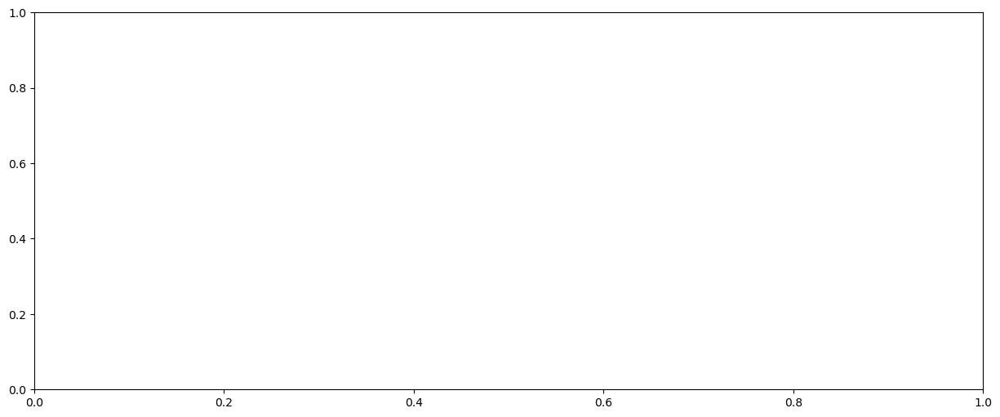

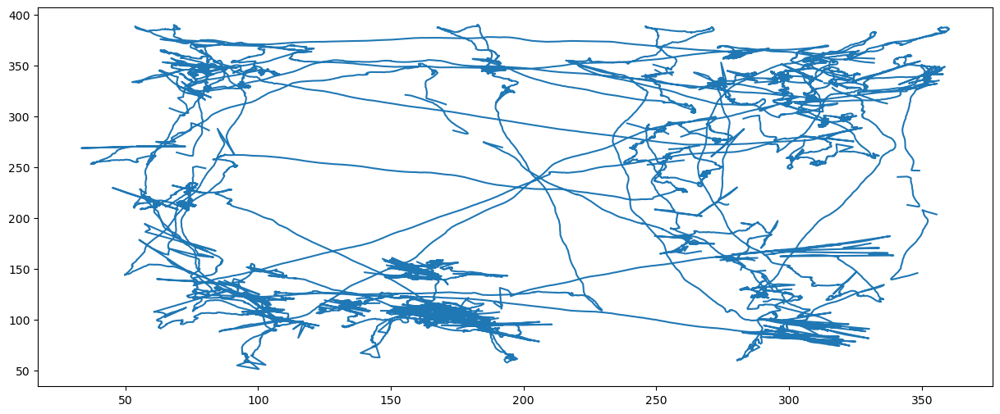

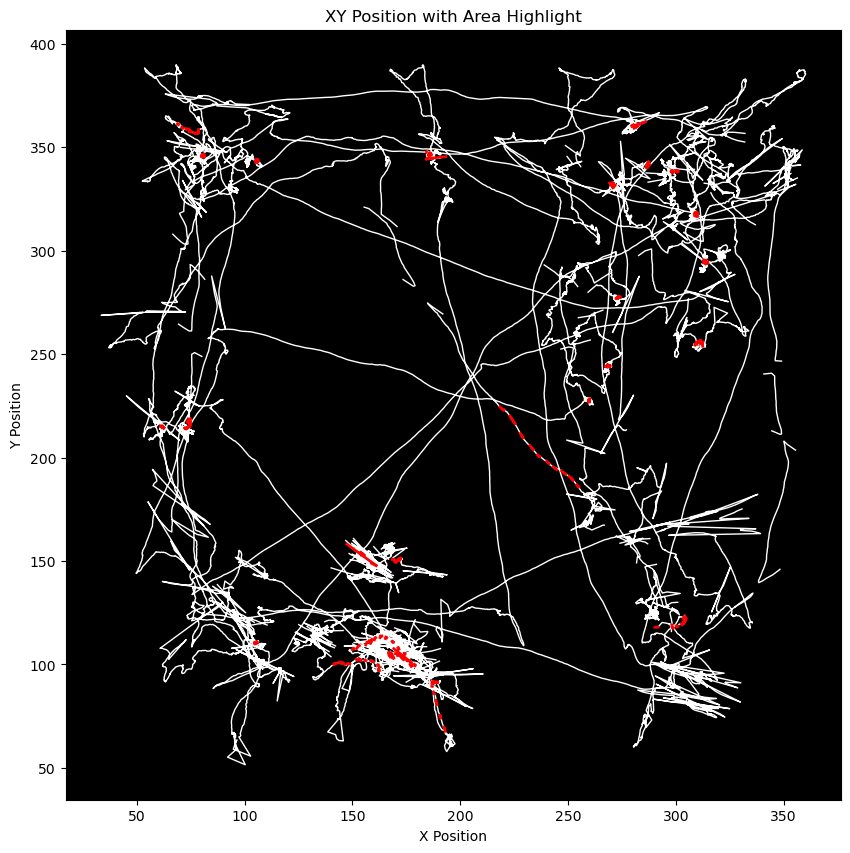

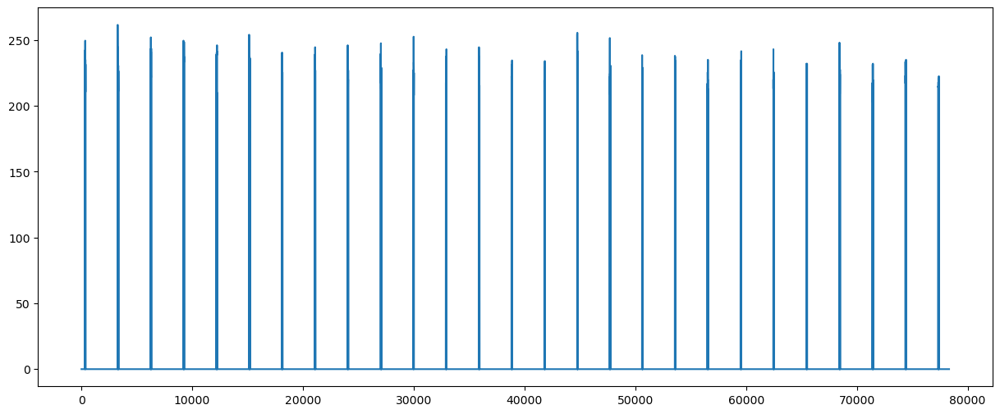

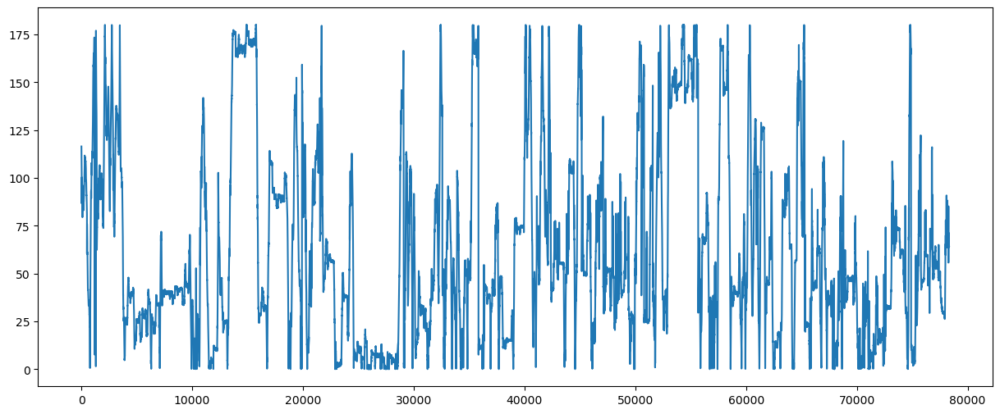

...

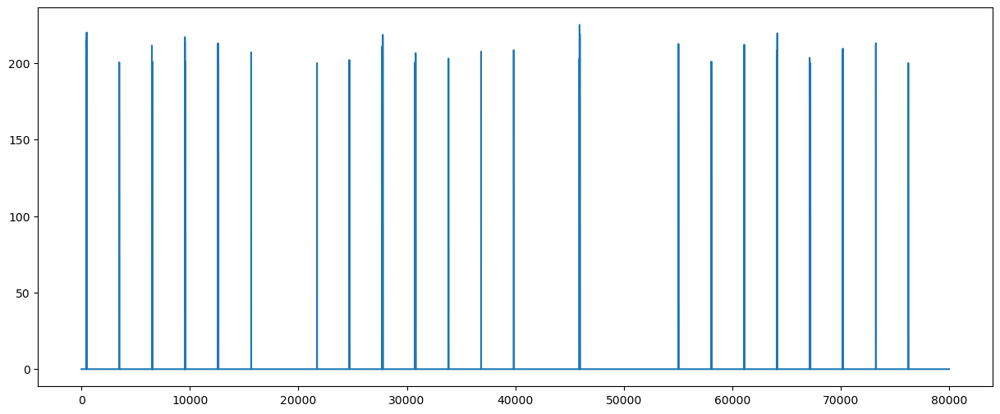

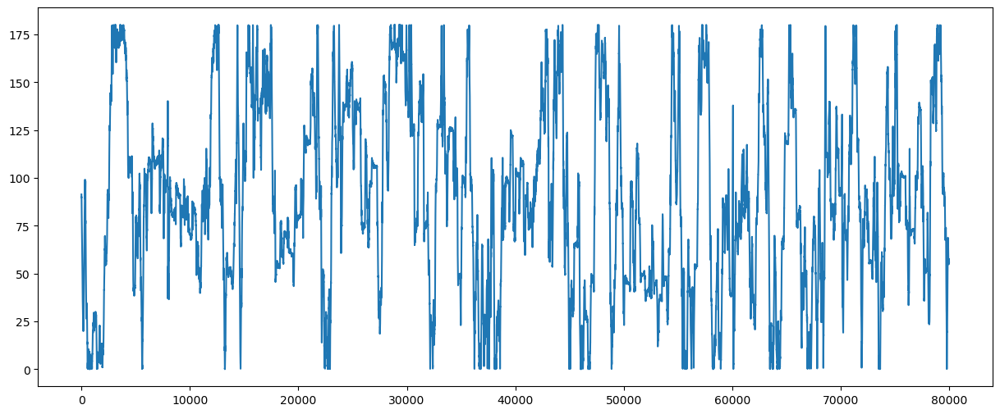

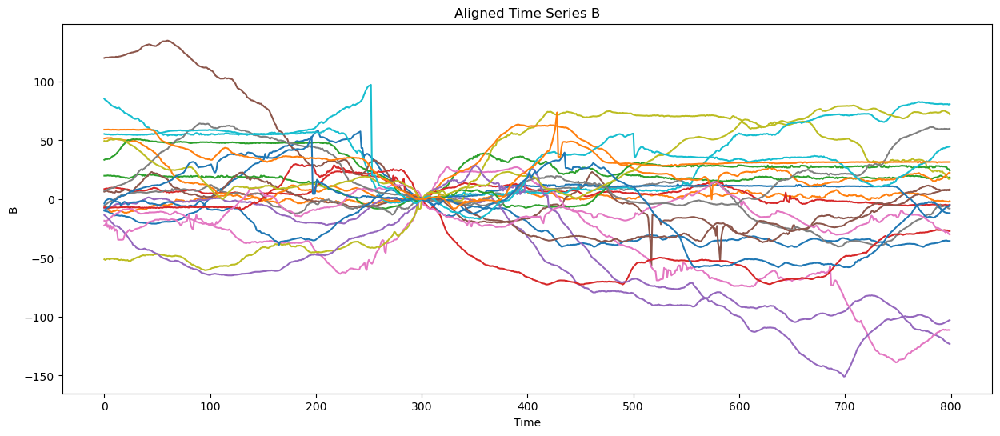

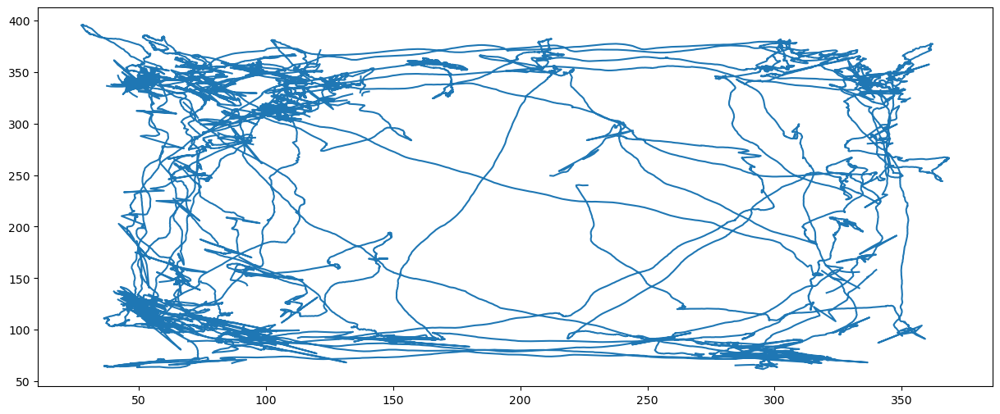

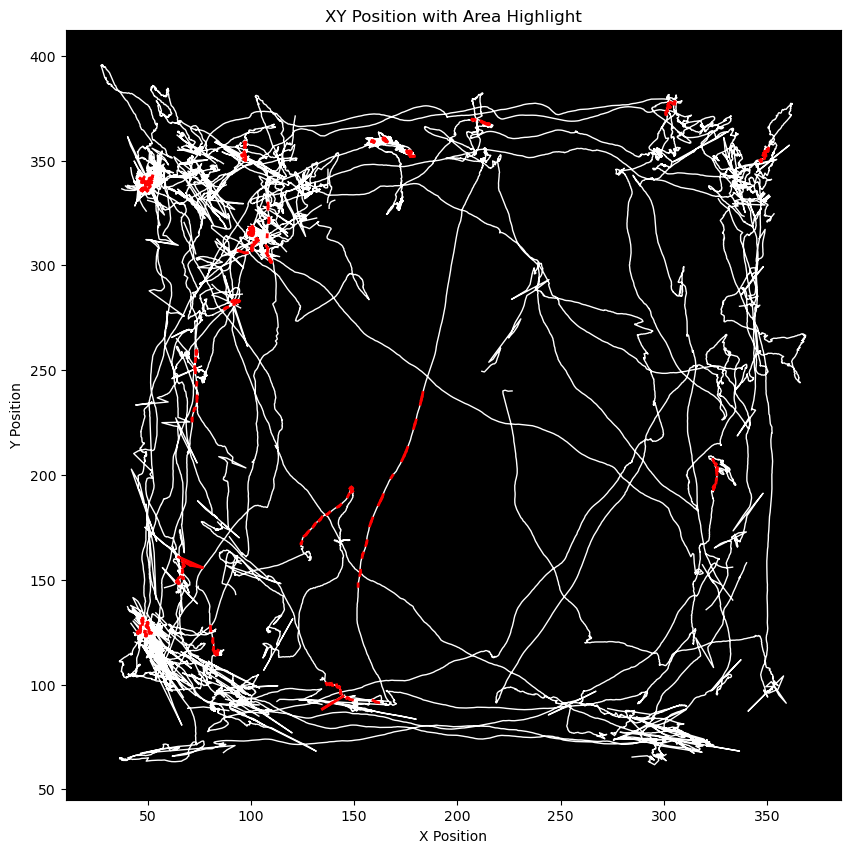

ValueError: x and y must have same first dimension, but have shapes (800,) and (0,)

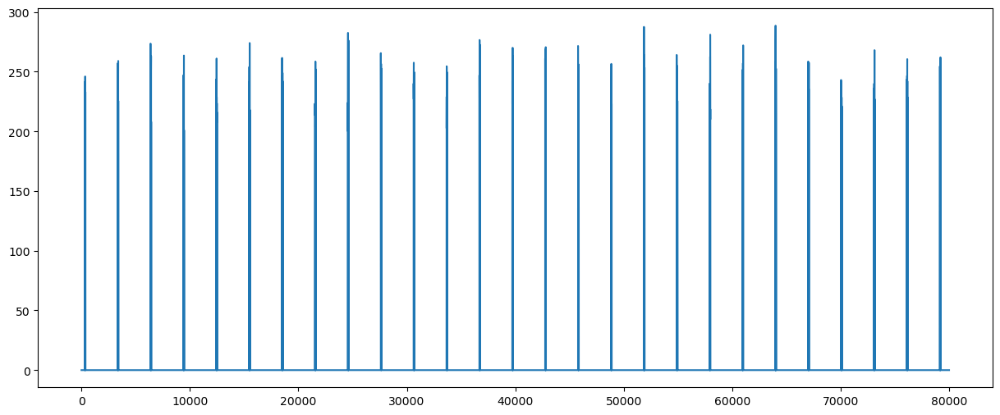

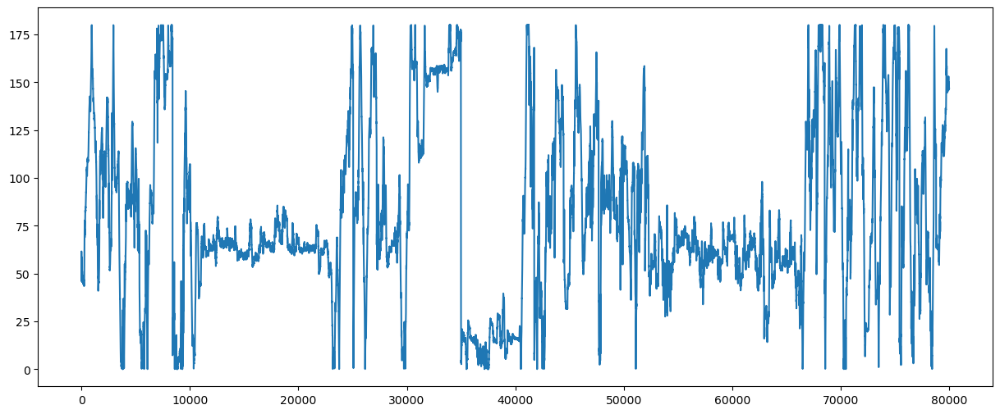

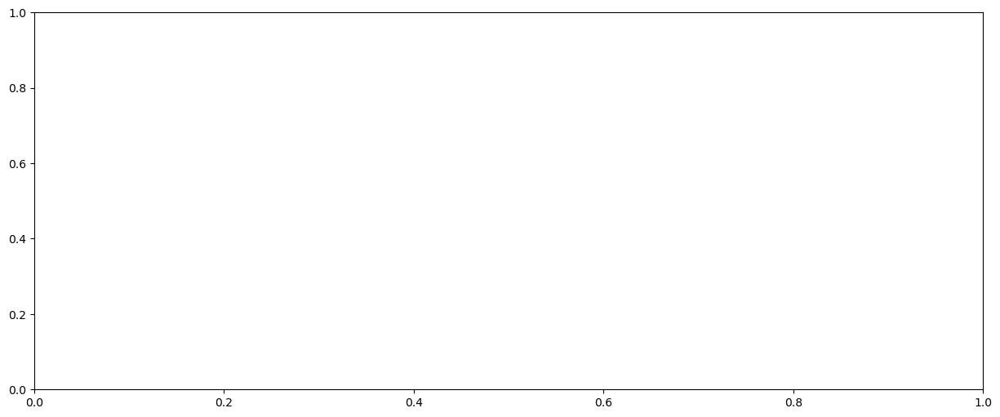

In [169]:
### Organize all data into python dict
from collections import defaultdict

search_key_path = ['*OF*']
search_key = ['OF']


clrs = sns.color_palette("viridis", n_colors=8)   

dict_ridge_widths = defaultdict(dict)
dict_ridge_all = defaultdict(dict)
fig, ax1 = plt.subplots(1, 1, figsize=(15,6))

for j in np.arange(len(search_key_path)):
    data_location = "Z://UusisaariU//PROCESSED_DATA_BACKUPS//nRIM_MEMBERS//Salvo//flir_cameras//M322_336//21April2024_OF//"
    LED_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'LED_track//*.csv'))
#     TA_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'side_cam//*.csv'))
    Centroid_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'Centroid_XY_Orientation//*.csv'))
#     RidgeX_ExcelList_to_open = glob.glob(os.path.join(os.path.sep, data_location, search_key_path[j], 'Ridge_X//*.csv'))
    
#   Sort files based on filenames
    # Sort the file list based on filename
    LED_ExcelList_to_open = sorted(LED_ExcelList_to_open, key=lambda x: os.path.basename(x))
#     TA_ExcelList_to_open = sorted(TA_ExcelList_to_open, key=lambda x: os.path.basename(x))
    Centroid_ExcelList_to_open = sorted(Centroid_ExcelList_to_open, key=lambda x: os.path.basename(x))
#     RidgeX_ExcelList_to_open = sorted(RidgeX_ExcelList_to_open, key=lambda x: os.path.basename(x))
    
    
    for i in np.arange(len(LED_ExcelList_to_open)): # len(peaks)
        #Extract arrays
        LED_traj = LED_excel_to_array_preprocessed(LED_ExcelList_to_open, chunk_width, i)
        CentroidX_traj, CentroidY_traj, Orientation_traj = extract_Centroid(Centroid_ExcelList_to_open, chunk_width, i)
#         RidgeX_traj = RidgeX_excel_to_array_preprocessed(RidgeX_ExcelList_to_open, chunk_width, i)

#         #Extract traces of Centroid and Tail Angle around the time frame when the mouse is at the ridge center
#         a = firstNonNan(CentroidX_traj)
#         b = round((np.size(CentroidX_traj) - np.count_nonzero(np.isnan(CentroidX_traj)))/2)
#         c = a + b
#         #Instead extract the position of the longest continous nonNaN from topcam centroid
#         a, b = longest_non_nan_sequence(CentroidX_traj)
#         a= a+30+2 #add 2 to take into account bodypart label rows in excel files (a is added 30 to prevent tracking HH hand)
#         b = b+2
#         a_tc = a-2
#         b_tc = b-2

#         #Take tail angle traj after extracting chunk of traj of interest around c
#         print(TA_ExcelList_to_open[i], a, b)
#         TA1, TA2, TA3, TA4, TA5, TA6, TA7 = plot_TailAngle(TA_ExcelList_to_open, chunk_width, i, a, b)        
#         HipAngle_traj = plot_HipAngle(TA_ExcelList_to_open, chunk_width, i, a, b)
#         pawangle, RPaw_traj, LPaw_traj = plot_PawAngle(TA_ExcelList_to_open, chunk_width, i)

#         #Extract traces chunk, if from side cam interval is [a:b], TopCam [a_tc:b_tc]
#         TA1_chunk = fill_nan(TA1[a:b])
#         TA2_chunk = fill_nan(TA2[a:b])
#         TA3_chunk = fill_nan(TA3[a:b])
#         TA4_chunk = fill_nan(TA4[a:b])
#         TA5_chunk = fill_nan(TA5[a:b])
#         TA6_chunk = fill_nan(TA6[a:b])
#         TA7_chunk = fill_nan(TA7[a:b])

#         HipAngle_traj_chunk = fill_nan(HipAngle_traj[a:b])
#         RPaw_traj_traj_chunk = RPaw_traj[a:b]
#         LPaw_traj_traj_chunk = LPaw_traj[a:b]
# #         BodyAxis_traj_chunk = fill_nan(BodyAxis_traj[c-chunk_width:c+chunk_width])

        CentroidX_traj_chunk = fill_nan(CentroidX_traj)#[a_tc:b_tc])
        CentroidY_traj_chunk = fill_nan(CentroidY_traj)#[a_tc:b_tc])
        CentroidX_chunk  = fill_nan(CentroidX_traj)#[a_tc:b_tc])
        LED_traj_chunk = fill_nan(LED_traj)#[a:b])
        Orientation_traj_chunk = fill_nan(abs(Orientation_traj))#[a:b])

#         RidgeX_traj_chunk = fill_nan(RidgeX_traj[a:b])
        
        #Decide here what variables to plot in the three figures
        var1 = np.array(LED_traj_chunk)
        var2 = np.array(LED_traj_chunk)
        var3 = np.array(CentroidX_traj_chunk)
        var4 = np.array(LED_traj_chunk)
        var5 = CentroidX_traj_chunk
        var6 = Orientation_traj_chunk#RidgeX_traj_chunk
#        Plot traces
        fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
        ax1.plot(CentroidX_traj, CentroidY_traj)
        plot_xy_with_area(CentroidX_traj, CentroidY_traj, LED_traj, 100)
        
        fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
        ax1.plot(LED_traj)
        fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
        ax1.plot(abs(Orientation_traj_chunk))
        
        fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
        find_trigger_points(LED_traj_chunk, Orientation_traj_chunk)
        
        
        key_file_name_LED = os.path.basename(LED_ExcelList_to_open[i])
        key_file_name_CentXY = os.path.basename(Centroid_ExcelList_to_open[i])

        ax1.set_title([key_file_name_LED, key_file_name_CentXY])

        #Make dict
        dict_ridge_widths[search_key[j]][key_file_name_LED] = [var1, var2, var3, var4, var5, var6]

        dict_ridge_all['all'][key_file_name_LED] = [var1, var2, var3, var4]

In [ ]:
beg_inter_PSTH = 100
end_inter_PSTH = 500

In [ ]:
def find_peak_onset(arr, jump_threshold):
    # Find the first index where the difference between consecutive elements exceeds the jump threshold
    for i in range(1, len(arr)):
        if arr[i] - arr[i-1] > jump_threshold:
            return i
    # If no peak onset is found, return None
    return None


In [ ]:
def assign_dict_value_LEDPeak(dict_ridge):
    #Find ridge peak for pert trials (-1, 1 values) and append to 7th column
    values_list = list(dict_ridge.values())
    key_list = list(dict_ridge.keys())

    for i in np.arange(len(key_list)):
        LEDTraj = values_list[i][0]
        #Choose a threshold value to detect (for now 1000)
        ridge_tilt_peak_idx = find_peak_onset(LEDTraj, 100)
        if ridge_tilt_peak_idx:

            #Use this for PSTH centered at beg of tilt
            dict_ridge[key_list[i]].append(ridge_tilt_peak_idx)  
#             print(ridge_tilt_peak_idx)
        else:
            print('Deleted trial because no LED detected', key_list[i], (LEDTraj))
            fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
            plt.plot(LEDTraj)
            plt.title("{i}".format(i = key_list[i]))
            dict_ridge[key_list[i]].append(None)  


# #             plt.plot(LEDTraj)
#             #eliminate trials without LED change detected
#             key_to_be_deleted = key_list[i]
#             dict_ridge.pop(key_to_be_deleted, None)            

    return dict_ridge

In [ ]:
def assign_dict_value_ridge_pos(dict_ridge):
    #Divide trials based on ridge position. Assign -1 for left tilt, +1 for right and 0 for no tilts. Append to 4th col
    #Changed the threshold from 5000 to 10000 bcs M53 detected many no pert trials as pert
#     fig, ax1 = plt.subplots(1, 1, figsize=(15,6))

    values_list = list(dict_ridge.values())
    key_list = list(dict_ridge.keys())
    for i in np.arange(len(key_list)): 
        LED_peak = values_list[i][-1]
        RidgeX_trace = values_list[i][5]
        RidgeX_chunk = RidgeX_trace[LED_peak-beg_inter_PSTH:LED_peak+end_inter_PSTH]
#         LED_trace = values_list[i][0]
#         TA_trace = values_list[i][1]


        if len(RidgeX_chunk)>100:
#             #print((ridge_array_translated_nonNaN[20:40]))
# #             print(key_list[i])#, LED_peak-beg_inter_PSTH, LED_peak+end_inter_PSTH) 
#             fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
#             ax1.set_title(key_list[i])
#             plt.plot(RidgeX_chunk)
#             plt.plot(RidgeX_trace)
#             plt.plot(LED_trace)
#             plt.plot(TA_trace)

            ridge_array_translated_nonNaN_mean_centered = RidgeX_chunk-RidgeX_chunk[beg_inter_PSTH]
            ridge_array_translated_int = np.trapz(smooth(ridge_array_translated_nonNaN_mean_centered, 10))
            ridge_array_translated_nonNaN_mean_centered_diff_max = max(np.diff(ridge_array_translated_nonNaN_mean_centered))
#             print(ridge_array_translated_int)
#             plt.plot(RidgeX_trace)

            if ridge_array_translated_int < -1000:
                dict_ridge[key_list[i]].append(-1)
                #print(ridge_array_translated_nonNaN_mean_centered_diff_max)
            elif ridge_array_translated_int > +1000:
                dict_ridge[key_list[i]].append(1)
        #        print(ridge_array_translated_int)

            else:
#                 fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
                dict_ridge[key_list[i]].append(None)
                print('No identifiable direction', key_list[i])  
#                 plt.plot(RidgeX_trace)
        else:
            print('No ridge trace', key_list[i])  
            dict_ridge[key_list[i]].append(None)

    return dict_ridge

In [ ]:
def assign_dict_value_TA_and_Ridge_chunkPSTH(dict_ridge):
    # Take pert trials (9th col) and based on peak (7th col) extract chunk of flipped Ridge and TA traj (6th and 10th col) 
    # Assign those traces to col 11 and 12
    
    values_list = list(dict_ridge.values())
    key_list = list(dict_ridge.keys())
    fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
    for i in np.arange(len(key_list)):
        HA_trace = values_list[i][3][2]
        TA_trace = values_list[i][1]
        LED_peak = values_list[i][-2]
        LED_trace = values_list[i][0]
        RidgeX_trace = values_list[i][5]
        Tilt_direction = values_list[i][-1]
        
        if LED_peak is not None:  # Check if LED_peak is not None
#             print(LED_peak)
            TA_chunk = TA_trace[LED_peak-beg_inter_PSTH:LED_peak+end_inter_PSTH]
            HA_chunk = HA_trace[LED_peak-beg_inter_PSTH:LED_peak+end_inter_PSTH]
            LED_chunk = LED_trace[LED_peak-beg_inter_PSTH:LED_peak+end_inter_PSTH]
            RidgeX_chunk = RidgeX_trace[LED_peak-beg_inter_PSTH:LED_peak+end_inter_PSTH]

            plt.plot(LED_chunk/50)
            plt.plot(RidgeX_chunk)
            plt.title("{i}".format(i = key_list[i]))

            dict_ridge[key_list[i]].append([TA_chunk, LED_chunk, LED_peak, RidgeX_chunk, Tilt_direction])
        else:
            print('No LED peak to be found')

    return dict_ridge


In [ ]:
#Write script to pre-process and organize all pert trial into python dict for dict with seperate widths

search_key = ['29March2024', '01April2024', '02April2024', '03April2024']#,'13March2024', '14March2024']#, 'L_4mm_27July2023', 'R_4mm_28July2023', \

dict_percswings_widths = defaultdict(dict)

for i in np.arange(len(search_key)):
    dict_ridge = dict_ridge_widths[search_key[i]]
    dict_ridge = assign_dict_value_LEDPeak(dict_ridge)
    dict_ridge = assign_dict_value_ridge_pos(dict_ridge)
    dict_ridge = assign_dict_value_TA_and_Ridge_chunkPSTH(dict_ridge)
    dict_percswings_widths[search_key[i]] = dict_ridge

In [ ]:
# #Write script to pre-process and organize all pert trial into python dict

# search_key = ['all']#, '5mm', '8mm', '10mm']
# dict_percswings_all = defaultdict(dict)

# for i in np.arange(len(search_key)):
#     dict_ridge = dict_ridge_all[search_key[i]]
#     dict_ridge = assign_dict_value_ridge_pos(dict_ridge)
#     dict_ridge = assign_dict_value_FlippedRidgeTraces(dict_ridge)
#     dict_ridge = assign_dict_value_RidgePeak(dict_ridge)
#     dict_ridge = assign_dict_value_TAClassifier(dict_ridge)
#     dict_ridge = assign_dict_value_TrialClassifier(dict_ridge)
#     dict_ridge = assign_dict_value_FlippedTATraces(dict_ridge)
#     dict_ridge = assign_dict_value_TA_and_Ridge_chunkPSTH(dict_ridge)
# #    dict_ridge = alignSideandTopCamTraces(dict_ridge)
# #    dict_percswings_all[search_key[i]] = excludeNaNTATraces(dict_ridge)

  

In [ ]:
# def getTrajArray_from_dict(dict):
#     data = list(dict.items())
#     an_array = np.array(data)
#     return an_array

In [ ]:
def return_Mean_STD_forPSTH(array_value_dict):
    mean_array = np.nanmean(array_value_dict, axis = 0)
    STD_array = stats.sem(array_value_dict, nan_policy='omit')
    return mean_array, STD_array

In [ ]:
# def assign_quadrant_classifier(TA, no_quad = 6):
#     lst = np.arange(361)
#     chunks_list = np.array_split(lst, no_quad)
#     classifier = []
#     for i in np.arange(len(chunks_list)):
#         first_value = chunks_list[i][0]
#         last_value = chunks_list[i][-1]
#         if first_value <= TA <= last_value:
#             classifier = i
#     return classifier

In [ ]:
###############Figure 4C

In [ ]:
# DECIDE HERE INTERVAL TO PLOT
int_beg = 0
int_end = 500

In [ ]:
# def excludeTATracesHighDerivative(dict_ridge):
#     #Exclude from dict all trials where the TA traj derivative is high
#     values_list = list(dict_ridge.values())
#     key_list = list(dict_ridge.keys()) #trial
#     for i in np.arange(len(key_list)):
#         TA_traj = smooth(values_list[i][-3][0])
#         TA_diff = np.diff(TA_traj)
#         #print(TA_diff)
#         if np.any(TA_diff>100) or np.any(TA_diff<-100):
#             key_to_be_deleted = key_list[i]
#             dict_ridge.pop(key_to_be_deleted, None)

#     return dict_ridge   

In [ ]:
# def excludeTATracesabove180(dict_ridge):
#     #Exclude from dict all trials where the TA traj is higher than 180 before pert
#     values_list = list(dict_ridge.values())
#     key_list = list(dict_ridge.keys()) #trial
#     for i in np.arange(len(key_list)):
#         TA_traj = values_list[i][-1][0]#[0:250]
#         TA_traj_before_pert = TA_traj[0:100]
#         #BodyAxis = values_list[i][-3][3]
#         #plt.plot(TA_traj_before_pert)
#         if np.any(TA_traj>600) or np.any(TA_traj<-70):# or np.any(BodyAxis>150) or np.any(BodyAxis<50):
#             key_to_be_deleted = key_list[i]
#             dict_ridge.pop(key_to_be_deleted, None)

#     return dict_ridge   

In [ ]:
# def splitsequenceequally(seq, num):
#     avg = len(seq) / float(num)
#     out = []
#     last = 0.0

#     while last < len(seq):
#         out.append(seq[int(last):int(last + avg)])
#         last += avg

#     return out

In [ ]:
# def find_idx_trace_below_thresh(trace, thresh, ridge_peak):
#     #Take trace leftward to the peak
#     #trace_left = trace[0:100]
#     new_idx = 0
#     i = ridge_peak
#     trace = np.diff(smooth(trace, 20))
#     #print(trace, thresh, ridge_peak)
#     while i > 0:
#         if trace[i] < thresh:
#             new_idx = i
#             break
#         else:
#             i -= 1
#     return new_idx-10

In [ ]:
def adjust_array_360(arr, index, threshold_neg, threshold_pos):
    if len(arr)>200:
        if arr[index] < threshold_neg:
            arr = [value + 360 for value in arr]
        if arr[index] > threshold_pos:
            arr = [value - 360 for value in arr]
    else:
        print('some elements missing in tail array')
    return arr

In [ ]:
def plot_and_append_AngMomTraces(dict_ridge_Xwidth, color_list):
    fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
    HA_traj_list = []
    TA_traj_list = []
    HA_traj_list_AngMom = []
    TA_traj_list_AngMom = []
    Ridge_traj_list = []
    TA_cum_angmom_list = []
    TA_HA_comb_list = []
    clrs = sns.color_palette("viridis", n_colors=8)   
    values_filename_list = list(dict_ridge_Xwidth.values())
    key_filename_list = list(dict_ridge_Xwidth.keys())
    for i in np.arange(len(key_filename_list)):
        TA_traj = values_filename_list[i][-1][0]
        LED_traj = values_filename_list[i][-1][1]
        Ridge_traj = values_filename_list[i][-1][3]
        Tilt_direction = values_filename_list[i][-1][4]


        if any(TA_traj) and Tilt_direction ==1:# and TA_traj[50]<200:# and len(TA_traj)==250:# and np.nanmean(TA_traj[30:50])>0 and all(TA_traj>-100) and all(TA_traj<420):# and all(TA_traj>100):
#             fig, ax1 = plt.subplots(figsize=(12, 8))

            plt.title("{i}".format(i = key_filename_list[i]))
            TA_to_append = (TA_traj)#-TA_traj[50])
            #Change array to adjust for cases of double rotation. Make sure to comment this line first to QC traces before
            TA_to_append = adjust_array_360(TA_to_append, beg_inter_PSTH, -10, 400)
            TA_to_append = adjust_array_360(TA_to_append, beg_inter_PSTH, -10, 400)
            TA_to_append = adjust_array_360(TA_to_append, beg_inter_PSTH, -10, 400)

            ax1.plot(Ridge_traj-Ridge_traj[beg_inter_PSTH])
            ax1.plot(TA_to_append)
            ax1.plot(LED_traj/50)
#             ax1.plot(Ridge_traj)
#             plt.ylim(-20, 50)


            TA_traj_list.append(TA_to_append)
        else:
            print('not enough elements in array')


                        
    return TA_traj_list#, HA_traj_list, Ridge_traj_list, TA_traj_list_AngMom, HA_traj_list_AngMom, TA_HA_comb_list

In [ ]:
def plot_PSTH_Mean_STD_label_color_pre_assigned(mean_array, std_array, ax, lineopacity, clrs, label_strings):
    with sns.axes_style("darkgrid"):
        for i in range(len(mean_array)):
            epochs = list(range(len(mean_array[i])))
            mean_array[i] = mean_array[i][int_beg:int_end]#-mean_array[i][100]
            x = np.linspace(0, (beg_inter_PSTH+end_inter_PSTH), len(mean_array[i]))
            ax1.plot(x, mean_array[i], c=clrs, alpha=lineopacity)
            ax1.fill_between(x, mean_array[i]-std_array[i][int_beg:int_end], mean_array[i]+std_array[i][int_beg:int_end], \
                            alpha=0.2, facecolor=clrs, label = label_strings)
            ax1.legend(loc="upper right", fontsize = 13, frameon=False)
            ax1.set_xlabel('Frame number (FR = 300 Hz)')
            ax1.set_ylabel('Angular Momentum (g-cm2/s)')
#             ax.axvline(57/0.3,0,360, color = 'red')
#             ax.axvline(73/0.3,0,360, color = 'red')
#             ax.axvline(85/0.3,0,360, color = 'red')

    return ax

In [ ]:
def compute_AngMom_width(TA_traj_list):
    mean_TA, std_TA = return_Mean_STD_forPSTH(TA_traj_list)
    means = [mean_TA]
    stds = [std_TA]
    return means, stds

In [ ]:
# sal_dict = dict_percswings_widths['SAL']
# print(list(sal_dict.keys()))

In [ ]:
# dict_TAmeansStds_byMouseID_Cond['M221']#['SAL']

In [ ]:
# Decide MouseID_key list here
# MouseID_key = ['M323_R_PulsesSHAM_Tilt5d', 'M323_R_PulsesSHAM_Tilt5d', 'M323_R_PulsesSHAM_Tilt5d']#, 'M323_L_Pulses8p5mW_Tilt5d', 'M332_R_PulsesSHAM_Tilt5d', 'M332_R_Pulses8p5mW_Tilt5d', \
#                'M335_R_PulsesSHAM_Tilt5d', 'M335_R_Pulses8p5mW_Tilt5d']

MouseID_key = ['M329_R_PulsesSHAM', 'M329_R_Pulses8p5mW', 'M329_L_PulsesSHAM']#'M323_R_PulsesSHAM_Tilt5d', 'M323_L_Pulses8p5mW_Tilt5d', 'M332_L_PulsesSHAM', 'M332_R_Pulses8p5mW', \
#                'M329_R_PulsesSHAM', 'M329_R_Pulses8p5mW', 'M335_L_PulsesSHAM', 'M335_R_Pulses8p5mW']#'M324_L_pulses_10mW', 'M325_L_pulses_10mW', 'M326_L_pulses_10mW', \
#                'M327_L_pulses_10mW', 'M328_L_pulses_10mW', 'M323_L_Pulses8p5mW_Tilt5d', 'M324_L_Pulses8p5mW_Tilt5d', \
#                'M325_L_Pulses8p5mW_Tilt5d', 'M326_L_Pulses8p5mW_Tilt5d', 'M327_L_Pulses8p5mW_Tilt5d', 'M328_L_Pulses8p5mW_Tilt5d', \
#                'M329_L_Pulses8p5mW_Tilt5d', 'M336_L_pulses_10mW']

# MouseID_key = ['M323_R_pulses_10mW', 'M324_R_pulses_10mW', 'M325_R_pulses_10mW', 'M326_R_pulses_10mW', \
#                'M327_R_pulses_10mW', 'M328_R_pulses_10mW', 'M329_R_pulses_10mW', 'M330_R_pulses_10mW', \
#                'M331_R_pulses_10mW', 'M332_R_pulses_10mW', 'M333_R_pulses_10mW', 'M334_R_pulses_10mW', \
#                'M335_R_pulses_10mW', 'M336_R_pulses_10mW']

# MouseID_key = ['M335_R_pulses_10mW', 'M335_R_pulses_7p5mW', 'M335_R_pulses_5mW', 'M335_R_pulses_1p5mW']

MouseID_key = [mouse_id.replace('_L_pulses_10mW', '_R_PulsesSHAM_Tilt5d') for mouse_id in MouseID_key]
# print(MouseID_key)

In [ ]:
#Plot trials of same width together changing the dict_ridge_all key

Xwidth_keys = ['29March2024', '01April2024', '02April2024', '03April2024']


# MouseID_key = ['M323_L_pulses_10mW', 'M324_L_pulses_10mW', 'M325_L_pulses_10mW', 'M326_L_pulses_10mW', \
#                'M327_L_pulses_10mW', 'M328_L_pulses_10mW', 'M329_L_pulses_10mW', 'M330_L_pulses_10mW', \
#                'M331_L_pulses_10mW', 'M332_L_pulses_10mW', 'M333_L_pulses_10mW', 'M334_L_pulses_10mW', \
#                'M335_L_pulses_10mW', 'M336_L_pulses_10mW']
# # MouseID_key = ['M323_R_pulses_10mW', 'M324_R_pulses_10mW', 'M325_R_pulses_10mW', 'M326_R_pulses_10mW', \
# #                'M327_R_pulses_10mW', 'M328_R_pulses_10mW', 'M329_R_pulses_10mW', 'M330_R_pulses_10mW', \
# #                'M331_R_pulses_10mW', 'M332_R_pulses_10mW', 'M333_R_pulses_10mW', 'M334_R_pulses_10mW', \
# #                'M335_R_pulses_10mW', 'M336_R_pulses_10mW']

# angmom_lowerinterv = [100, 100, 100, 100, 105, 105, 105]
# angmom_higherinterv = [150, 150, 150, 150, 150, 150]
color_list = ['y', 'r', 'b', 'g', 'y', 'r', 'b', 'g']
#fig, ax1 = plt.subplots(1, 1, figsize=(15,6))

list_std_AngMom = []
list_TAtraj_means = []
list_TAtraj_stds = []
dict_TAmeansStds_byMouseID_Cond = defaultdict(dict)

for i in np.arange(len(Xwidth_keys)):
    list_TAtraj = []
    list_TAtraj_stds = []
    dict_ridge_Xwidth = dict_percswings_widths[Xwidth_keys[i]]
    for m in np.arange(len(MouseID_key)):
        dict_ridge_XwidthXmouseID = dict(filter(lambda item: MouseID_key[m] in item[0], dict_ridge_Xwidth.items()))
        TA_traj_list = plot_and_append_AngMomTraces(dict_ridge_XwidthXmouseID, color_list[i])

        
        



In [ ]:
#returr neg values
def neg(lst):
    return [x for x in lst if x < 0] or None

In [ ]:
clrs = sns.color_palette("husl", 8)
label_strings = Xwidth_keys
lineopacity = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]#

fig, ax1 = plt.subplots(figsize=(12, 8))


for j in np.arange(len(Xwidth_keys)):
#     fig, ax1 = plt.subplots(figsize=(12, 8))
    for i in np.arange(len(MouseID_key)):

        plot_PSTH_Mean_STD_label_color_pre_assigned(dict_TAmeansStds_byMouseID_Cond[MouseID_key[i]][Xwidth_keys[j]][0], \
                                                    dict_TAmeansStds_byMouseID_Cond[MouseID_key[i]][Xwidth_keys[j]][1], \
                                                    ax1, lineopacity[j], clrs[j], label_strings[j])
#         plt.ylim(0, 300)
        ax1.legend(loc="lower left", prop={'size': 12})
        ax1.set_xlabel('Time (s)', fontsize=24)
        ax1.set_ylabel('Tail angle (degree)', fontsize=24)
        ax1.tick_params(axis='both', which='major', labelsize=18) 
        fig.savefig('nopertTA_allMiceallWidth.svg', format='svg', dpi=1200)

In [ ]:
# for arr in TA_traj_list:
#     print(len(arr))

In [ ]:
########  plot mean of trials per mouse as single line, and average across all mice in single session with sem


In [ ]:
def plot_and_append_AngMomTraces(dict_ridge_Xwidth, color_list):
    fig, ax1 = plt.subplots(1, 1, figsize=(15,6))
    HA_traj_list = []
    TA_traj_list = []
    HA_traj_list_AngMom = []
    TA_traj_list_AngMom = []
    Ridge_traj_list = []
    TA_cum_angmom_list = []
    TA_HA_comb_list = []
    clrs = sns.color_palette("viridis", n_colors=8)   
    values_filename_list = list(dict_ridge_Xwidth.values())
    key_filename_list = list(dict_ridge_Xwidth.keys())
    for i in np.arange(len(key_filename_list)):
#             RidgePert_classvalue = values_filename_list[i][-8]
#             HA_traj = values_filename_list[i][-1][4]
        TA_traj = values_filename_list[i][-1][0]
        LED_traj = values_filename_list[i][-1][1]

        if any(TA_traj) and len(TA_traj)==250:# and np.nanmean(TA_traj[30:50])>0 and all(TA_traj>-100) and all(TA_traj<420):# and all(TA_traj>100):
#             fig, ax1 = plt.subplots(figsize=(12, 8))

            plt.title("{i}".format(i = key_filename_list[i]))
            TA_to_append = -smooth(TA_traj-TA_traj[50], 10)
            ax1.plot(TA_to_append)
#             ax1.plot(LED_traj)

            TA_traj_list.append(TA_to_append)
        else:
            print('not enough elements in array')


                        
    return TA_traj_list#, HA_traj_list, Ridge_traj_list, TA_traj_list_AngMom, HA_traj_list_AngMom, TA_HA_comb_list

In [ ]:
def plot_PSTH_Mean_STD_label_color_pre_assigned(mean_array, std_array, ax, lineopacity, clrs, label_strings):
    with sns.axes_style("darkgrid"):
        for i in range(len(mean_array)):
            mean_array[i] = mean_array[i][int_beg:int_end]#-mean_array[i][100]
            x = np.linspace(0, (beg_inter_PSTH+end_inter_PSTH), len(mean_array[i][0]))
            ax1.plot(x, mean_array[i][0], c=clrs, alpha=0.5, lw = 0.7)
#             ax1.fill_between(x, mean_array[i][0]-std_array[i][0][int_beg:int_end], mean_array[i][0]+std_array[i][0][int_beg:int_end], \
#                             alpha=0.2, facecolor=clrs, label = label_strings)
            ax1.legend(loc="upper right", fontsize = 13, frameon=False)
            ax1.set_xlabel('Frame number (FR = 300 Hz)')
            ax1.set_ylabel('Angular Momentum (g-cm2/s)')
            
        # Calculate the mean and standard deviation across all arrays for each time step
        all_arrays_stacked = np.stack(mean_array)
        mean_across_arrays = np.mean(all_arrays_stacked, axis=0)
        std_across_arrays = stats.sem(all_arrays_stacked, axis=0)
        
        ax.plot(x, mean_across_arrays[0], c=clrs, linewidth=3, label='Mean Across Arrays')
        ax.fill_between(x, mean_across_arrays[0] - std_across_arrays[0], mean_across_arrays[0] + std_across_arrays[0], \
                        alpha=0.5, facecolor=clrs, label='Mean ± Std Across Arrays')

    return ax

In [ ]:
#Plot trials of same width together changing the dict_ridge_all key

Xwidth_keys = ['R_4mm_28July2023']#, 'R_4mm_13July2023']#, 'L_10mm_24July2023', 'L_45mm_22July2023']#, 'R_4mm_28July2023', \
#               'L_10mm_24July2023', 'R_10mm_25July2023', 'L_45mm_22July2023', 'R_45mm_23July2023']
#Mouse ID for L stim
# MouseID_key = ['M251', 'M253', 'M255', 'M258', 'M259', 'M260', 'M261', 'M262']
#Mouse ID for R stim
MouseID_key = ['M251', 'M253', 'M256', 'M260', 'M261', 'M262']

color_list = ['y', 'r', 'b', 'g', 'y', 'r', 'b', 'g']

list_std_AngMom = []
list_TAtraj_means = []
list_TAtraj_stds = []
dict_TAmeansStds_byMouseID_Cond = defaultdict(dict)

for i in np.arange(len(Xwidth_keys)):
    list_TAtraj = []
    list_TAtraj_stds = []
    dict_ridge_Xwidth = dict_percswings_widths[Xwidth_keys[i]]
    for m in np.arange(len(MouseID_key)):
        dict_ridge_XwidthXmouseID = dict(filter(lambda item: MouseID_key[m] in item[0], dict_ridge_Xwidth.items()))
        TA_traj_list = \
        plot_and_append_AngMomTraces(dict_ridge_XwidthXmouseID, color_list[i])
        #compute means+stds
        print(len(TA_traj_list))
        means, stds = compute_AngMom_width(TA_traj_list)
        list_TAtraj.append(means)
        list_TAtraj_stds.append(stds)
        dict_TAmeansStds_byMouseID_Cond[Xwidth_keys[i]] = [list_TAtraj, list_TAtraj_stds]
#         plt.ylim(-100, 250)
        



In [ ]:
# dict_TAmeansStds_byMouseID_Cond['R_4mm_28July2023']

In [ ]:
clrs = sns.color_palette("husl", 8)
label_strings = Xwidth_keys
lineopacity = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]#

fig, ax1 = plt.subplots(figsize=(12, 8))


for j in np.arange(len(Xwidth_keys)):
        plot_PSTH_Mean_STD_label_color_pre_assigned(dict_TAmeansStds_byMouseID_Cond[Xwidth_keys[j]][0], \
                                                    dict_TAmeansStds_byMouseID_Cond[Xwidth_keys[j]][1], \
                                                    ax1, lineopacity[j], clrs[j], label_strings[j])
        plt.ylim(-110, 110)
        ax1.legend(loc="lower left", prop={'size': 12})
        ax1.set_xlabel('Time (s)', fontsize=24)
        ax1.set_ylabel('Tail angle (degree)', fontsize=24)
        ax1.tick_params(axis='both', which='major', labelsize=18) 
        fig.savefig('nopertTA_allMiceallWidth.svg', format='svg', dpi=1200)

In [ ]:
####################Make csv files to do qualitative assessment

In [ ]:
# Specify the directory path you want to change to
new_directory = r'Z:\UusisaariU\PROCESSED_DATA_BACKUPS\nRIM_MEMBERS\Salvo\flir_cameras\M322_336\19March2024\side_cam'

# Change the current working directory
os.chdir(new_directory)

In [ ]:


def create_excel_file(directory, output_filename):
    # Get list of .avi files in the directory
    filenames = [filename for filename in os.listdir(directory) if filename.endswith('.avi')]
    
    # Sort the filenames
    filenames.sort()
    print(filenames)
    
    # Create a DataFrame with filenames
    df = pd.DataFrame({'Filename': filenames})
    
    # Write the DataFrame to an Excel file
    df.to_excel(output_filename, index=False)

# Example usage:
directory_path = r'Z:\UusisaariU\PROCESSED_DATA_BACKUPS\nRIM_MEMBERS\Salvo\flir_cameras\M322_336\19March2024\side_cam'  # Specify the directory path containing .avi files
excel_filename = 'Manual_assessment_VsOE.xlsx'  # Specify the name of the Excel file to create
create_excel_file(directory_path, excel_filename)


In [ ]:
import os

def identify_common_identifier(folder_path):
    # Dictionary to store counts of identifiers
    identifier_counts = {}
    
    # Loop through all files in the folder
    for filename in os.listdir(folder_path):
        # Check if the file is an AVI file
        if filename.endswith(".avi"):
            # Split the filename into parts based on the first hyphen
            parts = filename.split('-', 1)
            
            # Get the prefix before the first hyphen
            identifier = parts[0]
            
            # Count occurrences of each identifier
            if identifier in identifier_counts:
                identifier_counts[identifier] += 1
            else:
                identifier_counts[identifier] = 1
    
    # Find the common identifiers with counts greater than 1
    common_identifiers = [identifier for identifier, count in identifier_counts.items() if count > 1]
    
    # Sort the common identifiers alphabetically
    common_identifiers.sort()
    
    # Get the number of files per identifier in the same order as common_identifiers
    num_files_per_identifier = [identifier_counts[identifier] for identifier in common_identifiers]
    
    # Print the common identifiers and the number of files with each
    for common_identifier, num_files in zip(common_identifiers, num_files_per_identifier):
        print(common_identifier, num_files)

    
    # Return the common identifiers and the number of files per identifier
    return common_identifiers, num_files_per_identifier

# Example usage:
folder_path = 'Z:\\UusisaariU\\PROCESSED_DATA_BACKUPS\\nRIM_MEMBERS\\Salvo\\flir_cameras\\M322_336\\16April2024\\side_cam'
common_identifiers, num_files_per_identifier = identify_common_identifier(folder_path)
print(num_files_per_identifier)


In [ ]:
import os

def identify_common_identifier(folder_path):
    # Dictionary to store counts of identifiers
    identifier_counts = {}
    
    # Loop through all files in the folder
    for filename in os.listdir(folder_path):
        # Check if the file is an AVI file
        if filename.endswith(".avi"):
            # Split the filename into parts based on the first hyphen
            parts = filename.split('-', 1)
            
            # Get the prefix before the first hyphen
            identifier = parts[0]
            
            # Count occurrences of each identifier
            if identifier in identifier_counts:
                identifier_counts[identifier] += 1
            else:
                identifier_counts[identifier] = 1
    
    # Find the common identifiers with counts greater than 1
    common_identifiers = [identifier for identifier, count in identifier_counts.items() if count > 1]
    
    # Sort the common identifiers alphabetically
    common_identifiers.sort()
    
    # Get the number of files per identifier in the same order as common_identifiers
    num_files_per_identifier = [identifier_counts[identifier] for identifier in common_identifiers]
    
    # Print the common identifiers and the number of files with each
    for common_identifier, num_files in zip(common_identifiers, num_files_per_identifier):
        print(common_identifier, num_files)

    
    # Return the common identifiers and the number of files per identifier
    return common_identifiers, num_files_per_identifier

# Example usage:
folder_path = 'Z:\\UusisaariU\\PROCESSED_DATA_BACKUPS\\nRIM_MEMBERS\\Salvo\\flir_cameras\\M322_336\\19April2024\\side_cam'
common_identifiers, num_files_per_identifier = identify_common_identifier(folder_path)
print(num_files_per_identifier)
